<a href="https://colab.research.google.com/github/zhejindong/Deep-learning/blob/master/aml_hw5_part3.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [2]:
pip install pydrive 

    100% |████████████████████████████████| 993kB 22.5MB/s 
  Stored in directory: /root/.cache/pip/wheels/fa/d2/9a/d3b6b506c2da98289e5d417215ce34b696db856643bad779f4
Successfully built pydrive


In [0]:
import os
from pydrive.auth import GoogleAuth
from pydrive.drive import GoogleDrive
from google.colab import auth
from oauth2client.client import GoogleCredentials
auth.authenticate_user()
gauth = GoogleAuth()
gauth.credentials = GoogleCredentials.get_application_default()
drive = GoogleDrive(gauth)

In [0]:
import io
import zipfile
download = drive.CreateFile({'id': '1SXcu6LzIjd_Sh54dVFErLctDDnjW4etV'})
download.GetContentFile('IDC_regular_ps50_idx5.tar')

In [8]:
ls

adc.json  IDC_regular_ps50_idx5.tar  sample_data/


In [10]:
!unzip IDC_regular_ps50_idx5.tar

Archive:  IDC_regular_ps50_idx5.tar
  inflating: IDC_regular_ps50_idx5.zip  y



In [11]:
!unzip IDC_regular_ps50_idx5.zip

Archive:  IDC_regular_ps50_idx5.zip
   creating: 10253/
   creating: 10253/0/
 extracting: 10253/0/10253_idx5_x1001_y1001_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1051_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1101_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1151_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1201_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1251_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1301_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1351_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1501_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1551_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y1701_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y351_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y401_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y451_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y501_class0.png  
 extracting: 10253/0/10253_idx5_x1001_y551_class0.png  
 extracting: 10

In [32]:
import glob
import numpy as np 
import matplotlib.pyplot as plt
img=[]
for image_path in glob.glob("../content/*/0/*.png"):
    image = plt.imread(image_path)
    # delete bad picture files! 
    if(image.shape!=(50,50,3)):
      continue
    img.append(np.array(image))
    
print(len(img))

196454


In [0]:
import random
num=100000
train_x_0=random.sample(img, num)

In [0]:
del img

In [35]:
img1=[]
for image_path in glob.glob("../content/*/1/*.png"):
    #print(image_path)
    image = plt.imread(image_path)
    if(image.shape!=(50,50,3)):
      continue
    img1.append(np.array(image))
    
print(len(img1))

78768


In [36]:
ratio=196454/78786
#ratio=1
num1=int(num/ratio)
num1

4010

In [0]:
import random
train_x_1=random.sample(img1, num1)

In [0]:
del img1

In [148]:
y_train=[0]*len(train_x_0)+[1]*len(train_x_1)
y_train=np.array(y_train)
y_train.shape

(14010,)

In [149]:
train_x_0=np.array(train_x_0)
train_x_1=np.array(train_x_1)
X_train=np.vstack((train_x_0,train_x_1))
X_train.shape[0]

14010

In [0]:
from sklearn.model_selection import train_test_split
X_train, X_val, y_train, y_val = train_test_split(X_train,y_train,stratify=y_train,test_size=0.2,shuffle=True)

In [0]:
from imblearn.under_sampling import RandomUnderSampler
rus = RandomUnderSampler(random_state=42)
X, y_train = rus.fit_resample(X_train.reshape(X_train.shape[0],50*50*3), y_train)

In [0]:
X_train=X.reshape((X.shape[0],50,50,3))


# Brain Cancer Picture detection project 


## 3.1
Start with a model without residual connections (using batch normalization is likely to be
helpful and you should try it, whether you use dropout is your choice).

In [28]:
pip install keras-metrics

## comment on the model:

1 We shose recall as metric under the consideration that we don not want to miss any patient having brain cancer. 

2 When did data preprocessing, we randomly selected data from two classes by their ratio.


In [153]:
from keras import layers
from keras import models
from keras.models import Sequential
from keras import optimizers
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten
from keras.models import Model
from keras.layers import Dense, Activation,Dropout,BatchNormalization, Input
from keras import regularizers
from keras.wrappers.scikit_learn import KerasClassifier, KerasRegressor
import keras_metrics
from keras.callbacks import EarlyStopping

es = EarlyStopping(monitor = 'loss',mode = 'auto', verbose =1,min_delta =0,patience=0)
input_shape = (50,50,3)
num_classes = 1
model = Sequential()
model.add(Conv2D(16, kernel_size=(3, 3), activation = 'relu', input_shape=input_shape))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(8, (3, 3),activation ='relu'))
model.add(BatchNormalization())
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Flatten())
model.add(Dense(8, activation='relu'))
model.add(Dense(1, activation='sigmoid'))
model.compile(loss='binary_crossentropy',optimizer='adam',metrics=[keras_metrics.recall()])
history1=model.fit(X_train, y_train, batch_size=256, epochs=50, verbose=1, validation_data=(X_val,y_val),callbacks=[es])
model.save('CANCER.h5')

Train on 6416 samples, validate on 2802 samples
Epoch 1/50
6416/6416 [==============================] - 29s 4ms/step - loss: 0.5421 - recall: 0.7011 - val_loss: 0.5010 - val_recall: 0.6247
Epoch 2/50
6416/6416 [==============================] - 28s 4ms/step - loss: 0.4389 - recall: 0.7728 - val_loss: 0.4450 - val_recall: 0.6758
Epoch 3/50
6416/6416 [==============================] - 28s 4ms/step - loss: 0.4156 - recall: 0.8058 - val_loss: 0.5309 - val_recall: 0.4726
Epoch 4/50
6416/6416 [==============================] - 28s 4ms/step - loss: 0.4041 - recall: 0.8046 - val_loss: 0.4149 - val_recall: 0.6509
Epoch 5/50
6416/6416 [==============================] - 28s 4ms/step - loss: 0.4025 - recall: 0.8105 - val_loss: 0.4391 - val_recall: 0.7120
Epoch 6/50
6416/6416 [==============================] - 28s 4ms/step - loss: 0.3919 - recall: 0.8264 - val_loss: 0.4328 - val_recall: 0.6671
Epoch 7/50
6416/6416 [==============================] - 28s 4ms/step - loss: 0.3765 - recall: 0.8214 - val

Plot the loss of Model 

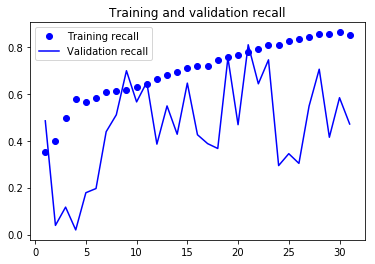

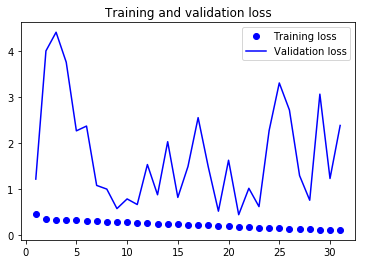

In [86]:
import matplotlib.pyplot as plt
acc = history1.history['recall']
val_acc = history1.history['val_recall']
loss = history1.history['loss']
val_loss = history1.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training recall')
plt.plot(epochs, val_acc, 'b', label='Validation recall')
plt.title('Training and validation recall')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

##3.2 Using data augmentation
Augment the data using rotations, mirroring and possibly other transformations. How much
can you improve your original model by data augmentation?

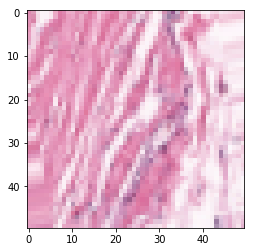

In [87]:
from keras.preprocessing.image import ImageDataGenerator
from keras.preprocessing import image
datagen = ImageDataGenerator(
rotation_range=40,
width_shift_range=0.0,
height_shift_range=0.0,
shear_range=0.2,
zoom_range=0.2,
horizontal_flip=True,
fill_mode='nearest')

# have a look at how the shape of augmented picture 
i = 0
for batch in datagen.flow(X_train, batch_size=1):
  plt.figure(i)
  imgplot = plt.imshow(image.array_to_img(batch[0]))
  i += 1
  if i % 1 == 0:
     break
  
plt.show()

### Training our convnet using data augmentation generators

In [0]:
from keras_metrics import recall
datagen.fit(X_train)
from keras.models import load_model
#model = load_model('CANCER.h5')
batches=0
es=EarlyStopping(monitor = 'loss',mode = 'auto', verbose =1,min_delta =0,patience=0)
for x_batch, y_batch in datagen.flow(X_train, y_train, batch_size=1024):
      print(x_batch.shape)
      history=model.fit(x_batch, y_batch, batch_size=256, epochs=50, verbose=1,validation_data=(X_val,y_val),callbacks=[es])
      batches += 1
      if batches >= len(X_train) / 1024:
            # we need to break the loop by hand because
            # the generator loops indefinitely
          break

(1024, 50, 50, 3)
Train on 1024 samples, validate on 2802 samples
Epoch 1/50
1024/1024 [==============================] - 8s 7ms/step - loss: 0.4110 - recall: 0.8507 - val_loss: 0.5154 - val_recall: 0.3516
Epoch 2/50
1024/1024 [==============================] - 8s 7ms/step - loss: 0.3996 - recall: 0.8193 - val_loss: 0.4426 - val_recall: 0.5960
Epoch 3/50
1024/1024 [==============================] - 7s 7ms/step - loss: 0.3744 - recall: 0.8035 - val_loss: 0.5141 - val_recall: 0.7706
Epoch 4/50
1024/1024 [==============================] - 7s 7ms/step - loss: 0.3632 - recall: 0.8369 - val_loss: 0.5998 - val_recall: 0.8741
Epoch 5/50
1024/1024 [==============================] - 7s 7ms/step - loss: 0.3558 - recall: 0.8428 - val_loss: 0.6727 - val_recall: 0.9202
Epoch 6/50
1024/1024 [==============================] - 7s 7ms/step - loss: 0.3448 - recall: 0.8409 - val_loss: 0.7598 - val_recall: 0.9177
Epoch 7/50
1024/1024 [==============================] - 7s 7ms/step - loss: 0.3336 - recall: 0

In [0]:
import matplotlib.pyplot as plt
acc = history.history['recall']
val_acc = history.history['val_recall']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training recall')
plt.plot(epochs, val_acc, 'b', label='Validation recall')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

##3.3
Build a deeper model using residual connections. Show that you can build a deep model
that would not be able to learn if you remove the residual connections (i.e. compare a deep
model with and without residual connections while the rest of the architecture is constant).

In [0]:
# Without residual connections 

from keras.layers import Input, Conv2D, MaxPooling2D, Flatten
from keras.models import Model
num_classes = 1

em=EarlyStopping(monitor = 'loss',mode = 'auto', verbose =1,min_delta =0,patience=0)

inputs = Input(shape=(50, 50, 3))
conv1_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(inputs)
conv1_2 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(conv1_1)
maxpool1 = MaxPooling2D(pool_size=(2, 2))(conv1_2)
conv2_1 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(maxpool1)
conv2_2 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(conv2_1)
maxpool2 = MaxPooling2D(pool_size=(2, 2))(conv2_2)


conv3_1 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(maxpool2)
conv3_2 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(conv3_1)
maxpool3 = MaxPooling2D(pool_size=(2, 2))(conv3_2)


conv4_1 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(maxpool3)
conv4_2 = Conv2D(8, (3, 3), activation='relu',
                 padding='same')(conv4_1)
maxpool4 = MaxPooling2D(pool_size=(2, 2))(conv4_2)


flat = Flatten()(maxpool4)
dense = Dense(8, activation='relu')(flat)
predictions = Dense(num_classes, activation='sigmoid')(dense)
model3 = Model(inputs=inputs, outputs=predictions)
model3.compile(loss='binary_crossentropy',optimizer='adam',metrics=[keras_metrics.recall()])
history=model3.fit(X_train, y_train, batch_size=256, epochs=50, verbose=1, validation_data=(X_val,y_val),callbacks=[es])

In [0]:
import matplotlib.pyplot as plt
acc = history.history['recall']
val_acc = history.history['val_recall']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training recall')
plt.plot(epochs, val_acc, 'b', label='Validation recall')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()

In [0]:
# add redidual layers 
from keras.layers import Input, Conv2D, MaxPooling2D, Flatten,add
from keras.models import Model
num_classes = 1
inputs = Input(shape=(50, 50, 3))
conv1_1 = Conv2D(32, (3, 3), activation='relu',
                 padding='same')(inputs)
conv1_2 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(conv1_1)
maxpool1 = MaxPooling2D(pool_size=(2, 2))(conv1_2)
conv2_1 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(maxpool1)
conv2_2 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(conv2_1)

# add residual layer 
skip2 = add([maxpool1, conv2_2])
maxpool2 = MaxPooling2D(pool_size=(2, 2))(skip2)

conv3_1 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(maxpool2)
conv3_2 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(conv3_1)

# add residual layer 
skip3 = add([maxpool2, conv3_2])
maxpool3 = MaxPooling2D(pool_size=(2, 2))(skip3)


conv4_1 = Conv2D(16, (3, 3), activation='relu',
                 padding='same')(maxpool3)
conv4_2 = Conv2D(8, (3, 3), activation='relu',
                 padding='same')(conv4_1)
maxpool4 = MaxPooling2D(pool_size=(2, 2))(conv4_2)

flat = Flatten()(maxpool4)
dense = Dense(32, activation='relu')(flat)
predictions = Dense(num_classes, activation='sigmoid')(dense)
model4 = Model(inputs=inputs, outputs=predictions)
model4.compile(loss='binary_crossentropy',optimizer='adam',metrics=[keras_metrics.recall()])
history=model4.fit(X_train, y_train, batch_size=256, epochs=50, verbose=1, validation_data=(X_val,y_val),callbacks=[es])

In [0]:
import matplotlib.pyplot as plt
acc = history.history['recall']
val_acc = history.history['val_recall']
loss = history.history['loss']
val_loss = history.history['val_loss']
epochs = range(1, len(acc) + 1)
plt.plot(epochs, acc, 'bo', label='Training recall')
plt.plot(epochs, val_acc, 'b', label='Validation recall')
plt.title('Training and validation accuracy')
plt.legend()
plt.figure()
plt.plot(epochs, loss, 'bo', label='Training loss')
plt.plot(epochs, val_loss, 'b', label='Validation loss')
plt.title('Training and validation loss')
plt.legend()
plt.show()